In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from argparse import Namespace
from pathlib import Path
import torch
from pytorch_lightning.trainer import Trainer, seed_everything
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

from turboflow.dataloaders import TurboFlowDataModule
from turboflow.evaluation import compute_all_metrics

from turboflow.utils import phy_utils as phy
from turboflow.utils import dsp_utils as dsp
from turboflow.utils import torch_utils as tch
from turboflow.utils import file_utils as fle
from turboflow.utils import viz_utils as viz

from mpl_toolkits.axes_grid.inset_locator import inset_axes, InsetPosition, mark_inset

import matplotlib.pyplot as plt

import glob

import numpy as np
import pandas as pd
import yaml

import seaborn as sns

from natsort import natsorted

/tmp/ipykernel_743653/1693278626.py:17: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  from mpl_toolkits.axes_grid.inset_locator import inset_axes, InsetPosition, mark_inset


In [3]:
# load dataset
data_dir = Path('/','home','dicarlo_d','Documents','Datasets','Turb2D.hdf5')
dm = TurboFlowDataModule(dataset='Turb2D', 
                         data_dir=data_dir,
                         batch_size=100000,
                         time_idx=333,
                         train_downsampling=4,
                         val_downsampling=4,
                         test_downsampling=1,
                         num_workers=1)
dm.setup()


X_lr, y_lr = dm.train_dataset[:]
img_shape_lr = dm.train_dataset.img_shape[:2]
shape_lr = dm.train_dataset.img_shape
L = shape_lr[0]
N_lr = X_lr.shape[0]
print(N_lr, L)

X_mr, y_mr = dm.val_dataset[:]
img_shape_mr = dm.val_dataset.img_shape[:2]
shape_mr = dm.val_dataset.img_shape
M = shape_mr[0]
N_mr = X_mr.shape[0]
print(N_mr, M)

X_hr, y_hr = dm.test_dataset[:]
img_shape_hr = dm.test_dataset.img_shape[:2]
shape_hr = dm.test_dataset.img_shape
H = shape_hr[0]
N_hr = X_hr.shape[0]
print(N_hr, H)

dsets_dict = {}

dsets = {
    'train' : dm.train_dataset,
    'val' : dm.val_dataset,
    'test' : dm.test_dataset
}

for stage in dsets.keys():
    tmp = {}
    
    dset = dsets[stage]
    X, y = dset[:]
    img_shape = dset.img_shape[:2]
    shape = dset.img_shape
    R = shape[0]
    
    print(stage, X.shape, y.shape, R)
    
    tmp['X'] = X
    tmp['y'] = y
    tmp['R'] = R
    tmp['img_shape'] = img_shape
    
    dsets_dict[stage] = tmp

4096 64
4096 64
65536 256
train torch.Size([4096, 2]) torch.Size([4096, 2]) 64
val torch.Size([4096, 2]) torch.Size([4096, 2]) 64
test torch.Size([65536, 2]) torch.Size([65536, 2]) 256


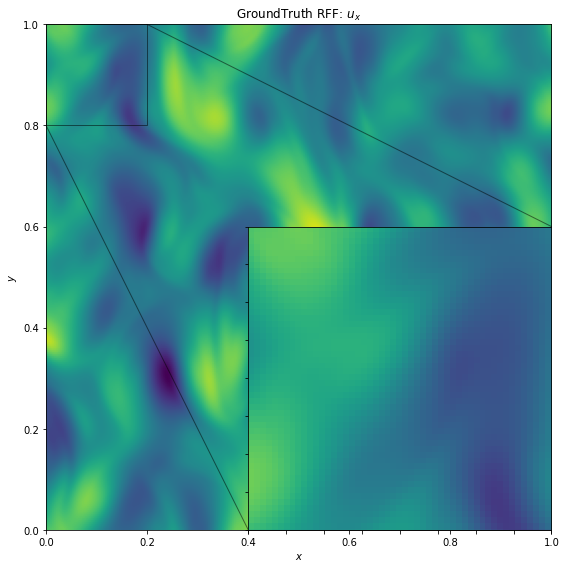

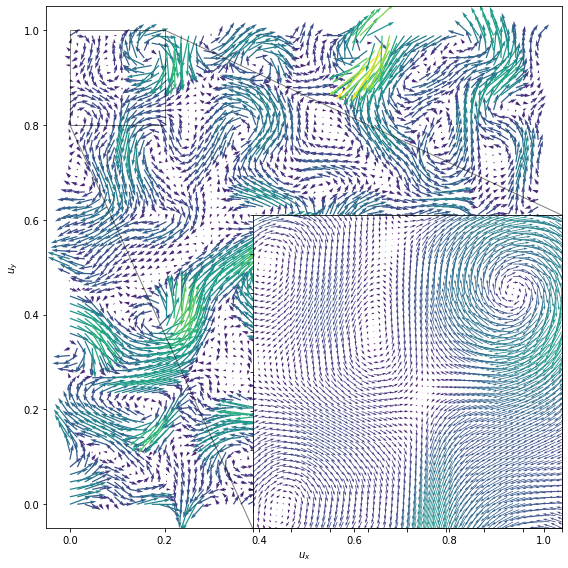

In [4]:
figsize = (8,8)
region=(0.00, 0.20, 0.80, 1)

Xlr = dsets_dict['train']['X']
Ulr = dsets_dict['train']['y']
L = dsets_dict['train']['R']
Xhr = dsets_dict['test']['X']
Uhr = dsets_dict['test']['y']
H = dsets_dict['test']['R']


viz.plot_lr_hr_inset(Uhr, Uhr, H, H, figsize=figsize, title='GroundTruth RFF', 
                     region = region,
                     only_u=True)
plt.show()

viz.plot_velocity_field(Xhr, Uhr, H, Xhr, Uhr, H,
                        title=None,
                        figsize=figsize,
                        region = region,
                        scale_lr=10, step_lr=4,
                        scale_hr=6, step_hr=1)
plt.tight_layout()
plt.show()

In [32]:
results_dir = Path('..','recipes','turbo2D','single_images','results_comparison')
files = glob.glob(str(results_dir.resolve()) + '/*.pkl')
files.sort(key=os.path.getmtime)
for f, file in enumerate(files):
    print(f, file.split('/')[-1])
# results_paths = natsorted(list(glob('*')))
results_paths = files

0 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:1e-3-lgrd:0-lcrl:0-lsfn:0-ni:3.pkl
1 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:1e-3-lgrd:0-lcrl:1e-8-lsfn:0-ni:3.pkl
2 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:1e-3-lgrd:1e-5-lcrl:0-lsfn:0-ni:3.pkl
3 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:1e-3-lgrd:1e-5-lcrl:1e-8-lsfn:0-ni:3.pkl
4 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:0-lgrd:0-lcrl:0-lsfn:0-ni:3.pkl
5 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:0-lgrd:0-lcrl:1e-8-lsfn:0-ni:3.pkl
6 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:0-lgrd:1e-5-lcrl:0-lsfn:0-ni:3.pkl
7 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:0-lgrd:1e-5-lcrl:1e-8-lsfn:0-ni:3.pkl
8 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:true-lsdv:1e-3-lgrd:0-lcrl:0-lsfn:0-ni:3.pkl
9 Turb2D_RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:true-lsdv:1e-3-lgrd:0-lcrl:1e-8-lsfn:0-ni:3.pkl
10 Turb2D_RFFMLP_

In [33]:
df = pd.DataFrame()

for p, path in enumerate(results_paths):
    path = Path(path)
    results_dict = fle.load_obj(path)
    
    df.at[p, 'name'] = results_dict['hparams']['name']
    df.at[p, 'version'] = results_dict['pl_version']
    df.at[p, 'success'] = results_dict['success']
    
    for field in ['mlp_layers_num','rff_num','lam_sdiv', 'do_divfree', 'lam_curl','lam_grads', 'lam_sfn', 'lam_weight']:
        df.at[p, field] = results_dict['hparams'][field]
    
    df.at[p, 'rec'] = results_dict['test_metrics'][0]['test/metrics/reconstruction']
    df.at[p, 'spc'] = results_dict['test_metrics'][0]['test/metrics/log_err_specturm']
    df.at[p, 'ang'] = results_dict['test_metrics'][0]['test/metrics/angular_degree']
    
    df.at[p, 'model_path'] = results_dict['path_to_best_model']
    
df.to_csv(results_dir / Path('../results.csv'))
df

,name,version,success,mlp_layers_num,rff_num,lam_sdiv,do_divfree,lam_curl,lam_grads,lam_sfn,lam_weight,rec,spc,ang,model_path
0,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_0,True,10.0,512.0,0.001,False,0.000000e+00,0.00000,0.000,0.0001,0.000286,60.731972,0.607316,/home/dicarlo_d/Documents/Code/TurboSuperResul...
1,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_1,True,10.0,512.0,0.001,False,1.000000e-08,0.00000,0.000,0.0001,0.001483,50.297386,1.602846,/home/dicarlo_d/Documents/Code/TurboSuperResul...
2,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_2,True,10.0,512.0,0.001,False,0.000000e+00,0.00001,0.000,0.0001,0.000298,74.532219,0.595888,/home/dicarlo_d/Documents/Code/TurboSuperResul...
3,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_3,True,10.0,512.0,0.001,False,1.000000e-08,0.00001,0.000,0.0001,0.001365,49.151733,1.541893,/home/dicarlo_d/Documents/Code/TurboSuperResul...
4,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_4,True,10.0,512.0,0.000,False,0.000000e+00,0.00000,0.000,0.0001,0.000286,66.774063,0.610597,/home/dicarlo_d/Documents/Code/TurboSuperResul...
5,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_5,True,10.0,512.0,0.000,False,1.000000e-08,0.00000,0.000,0.0001,0.001499,60.188972,1.613356,/home/dicarlo_d/Documents/Code/TurboSuperResul...
6,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_6,True,10.0,512.0,0.000,False,0.000000e+00,0.00001,0.000,0.0001,0.000438,68.867188,0.707275,/home/dicarlo_d/Documents/Code/TurboSuperResul...
7,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:fals...,version_7,True,10.0,512.0,0.000,False,1.000000e-08,0.00001,0.000,0.0001,0.001519,65.725281,1.618802,/home/dicarlo_d/Documents/Code/TurboSuperResul...
8,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:true...,version_8,True,10.0,512.0,0.001,True,0.000000e+00,0.00000,0.000,0.0001,0.014654,124.707794,4.949578,/home/dicarlo_d/Documents/Code/TurboSuperResul...
9,RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:true...,version_9,True,10.0,512.0,0.001,True,1.000000e-08,0.00000,0.000,0.0001,0.001238,74.718483,1.505131,/home/dicarlo_d/Documents/Code/TurboSuperResul...


version_2 


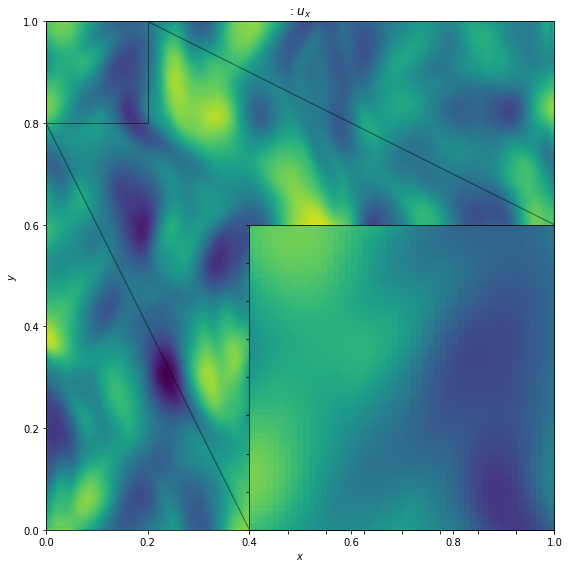

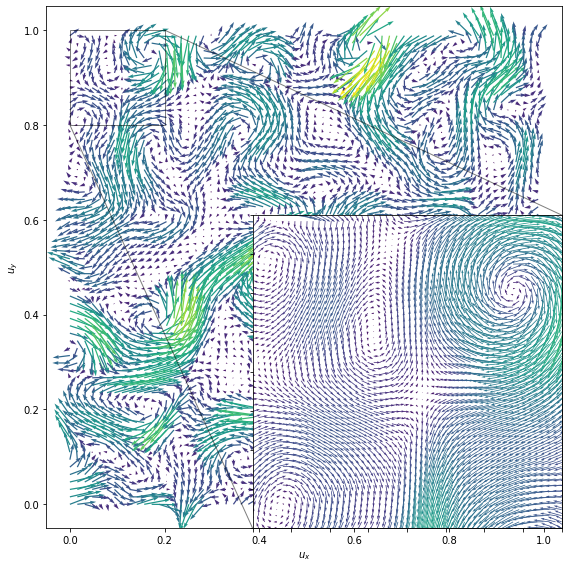

version_24 


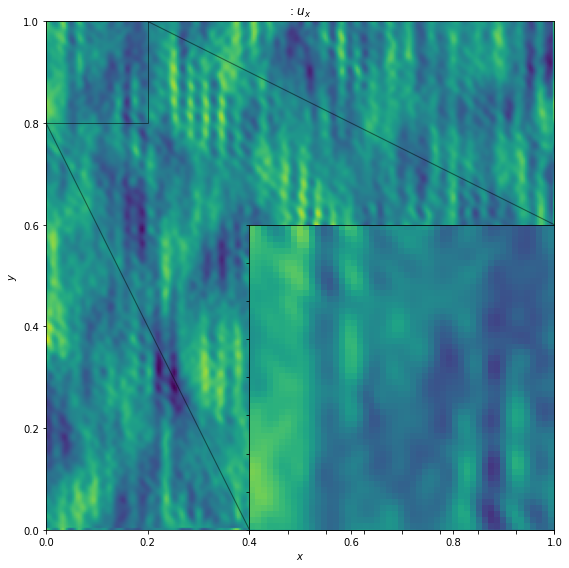

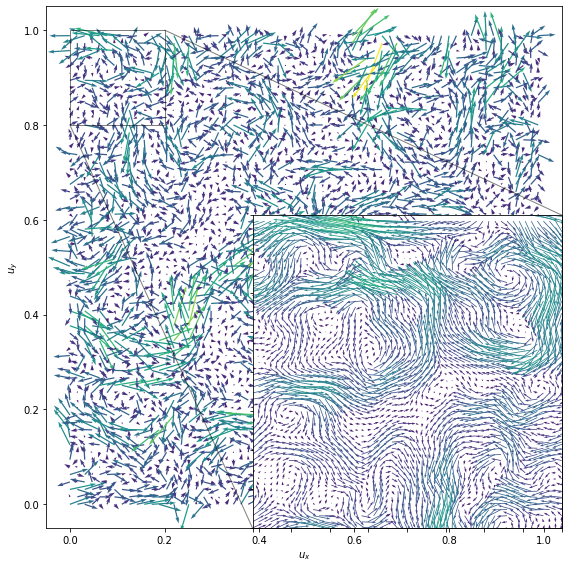

version_34 


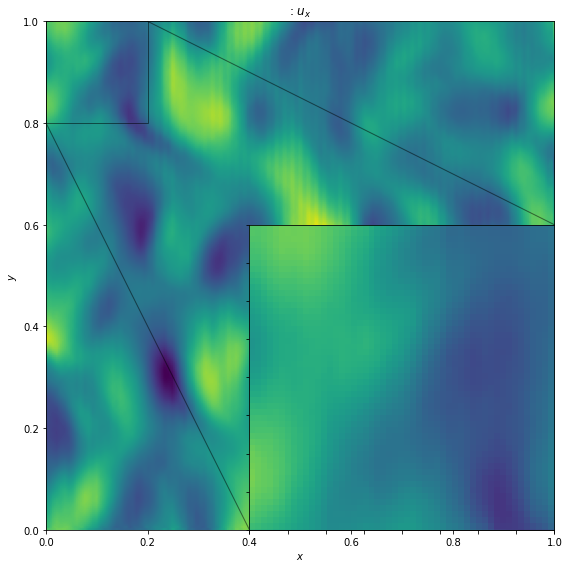

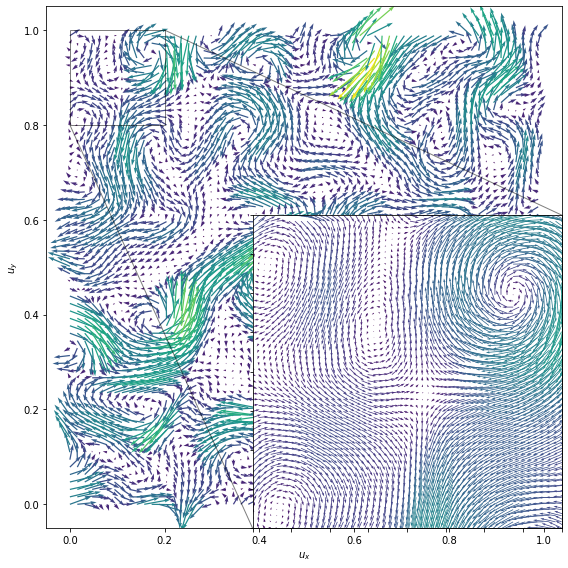

In [35]:
Xlr = dsets_dict['test']['X']
Ulr = dsets_dict['test']['y']
L = dsets_dict['test']['R']
Xhr = dsets_dict['test']['X']
Uhr = dsets_dict['test']['y']
H = dsets_dict['test']['R']

curr_df = df

figsize = (8,8)

for r, row in curr_df.iterrows():    
    
    if r not in [24, 2, 29]:
        continue
        
        
    if r == 4:
        label = 'Vanilla'
    if r == 0:
        label = 'soft_df'
    if r == 2:
        label = 'soft_df + grad'
    if r == 12:
        label = 'hard_df'
    if r == 11:
        label = 'hard_df + grad + curl'
    if r == 25:
        label = 'soft_df + Sfun'
    if r == 30:
        label = 'soft_df + Sfun + all'        
    if r == 28:
        label = 'hard_df + Sfun'
    if r == 29:
        label = 'hard_df + Sfun + all'
    
    model_path = row['model_path']
    rff_num = row['rff_num']
    do_divfree = row['do_divfree']
    lam_grads = row['lam_grads']
    lam_curl = row['lam_curl']
    version = row['version']
    
    hc_or_sc = 'Hard' if do_divfree else 'Soft'
    title = r'%s $\lambda$ = %.1E $\lambda$ = %.1E' % (hc_or_sc, lam_grads, lam_curl)
    title = ''
    print(version, title)
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    Uhr = model(X_hr)[0]
    Uhr = Uhr.detach().cpu().numpy()

    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)

    viz.plot_lr_hr_inset(Uhr, Uhr, H, H, figsize=figsize, title=title, 
                         region = region,
                         only_u=True)
    plt.show()

    viz.plot_velocity_field(Xhr.detach().cpu(), Uhr, L, Xhr.detach().cpu(), Uhr, H,
                            title=title,
                            figsize=figsize,
                            region = region,
                            scale_lr=10, step_lr=4,
                            scale_hr=5, step_hr=1)
    plt.tight_layout()
    plt.show()

version_0 soft_df


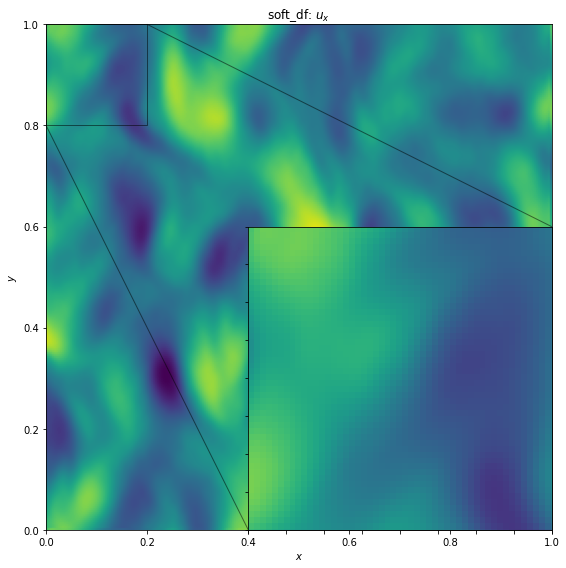

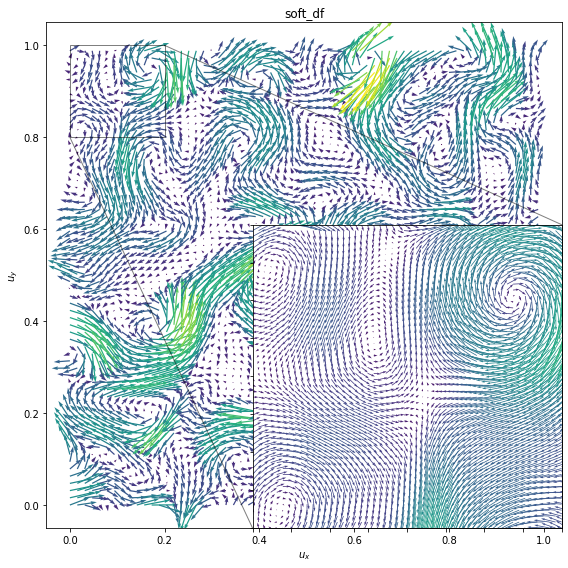

version_4 Vanilla


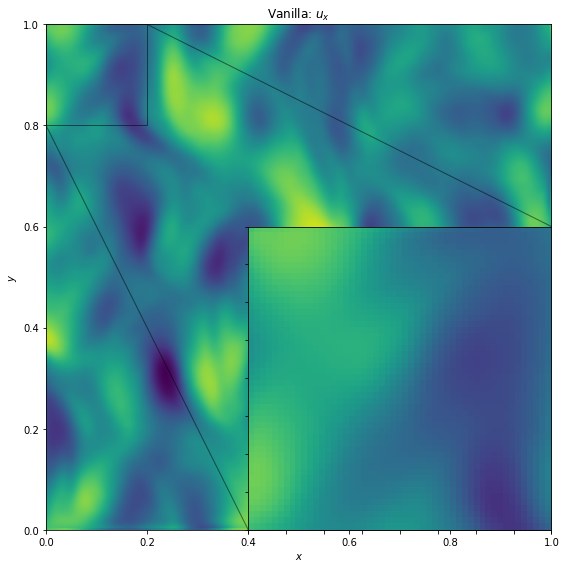

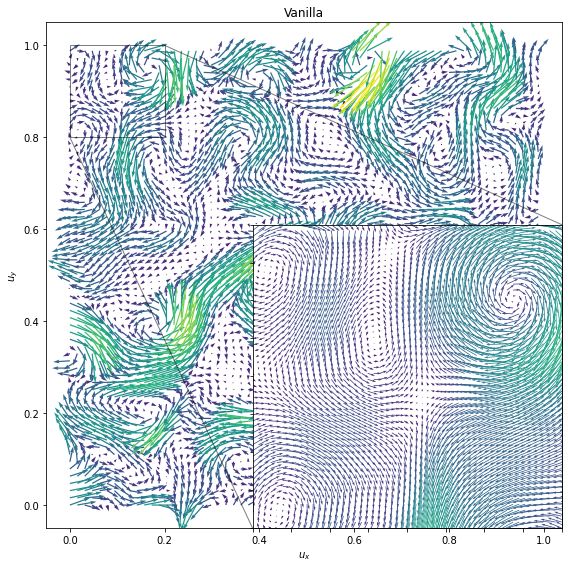

version_11 hard_df + grad + curl


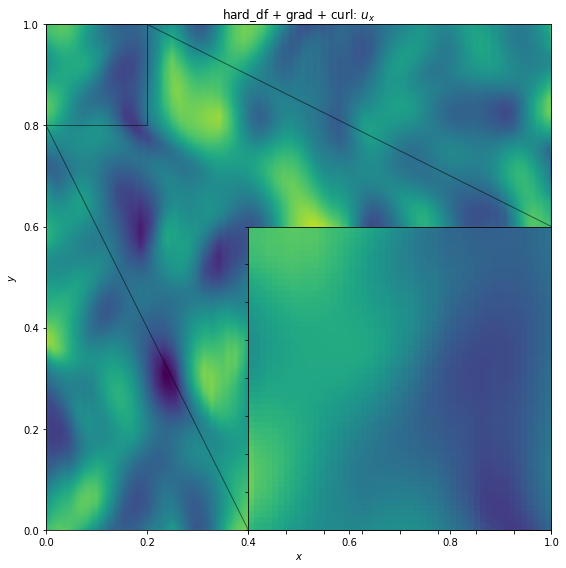

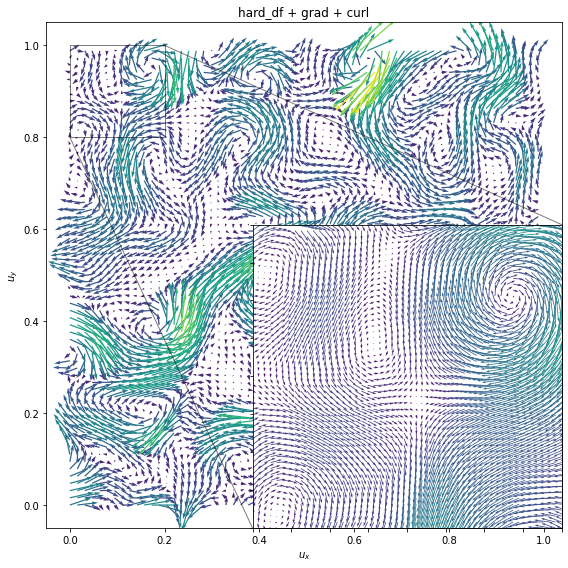

version_12 hard_df


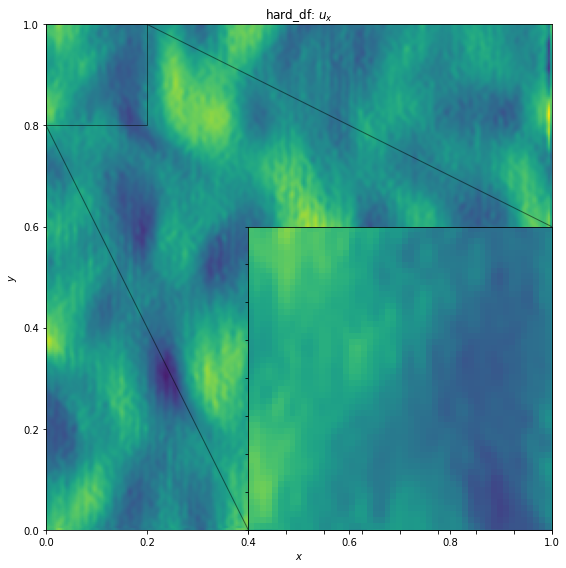

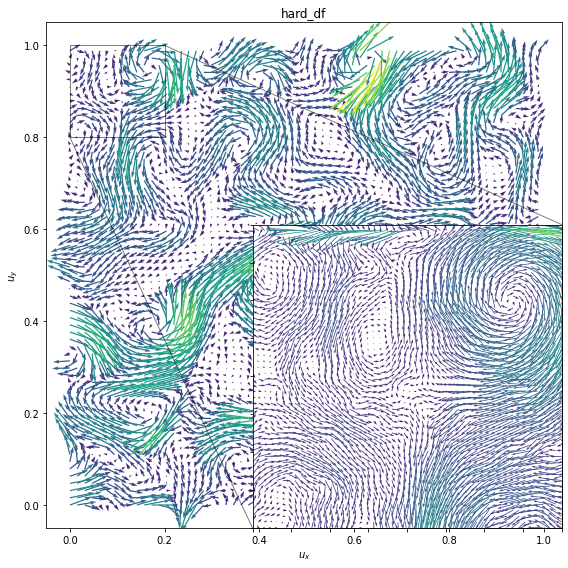

version_27 soft_df + Sfun


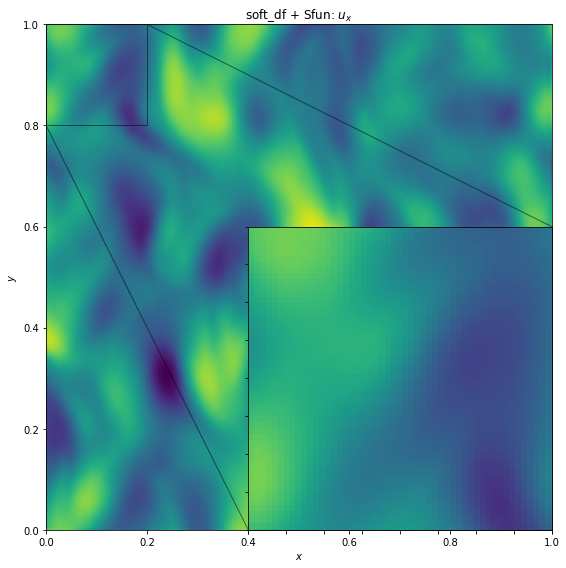

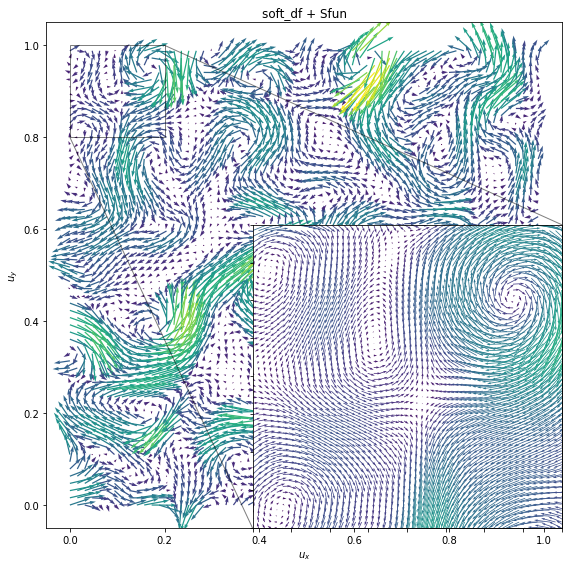

version_33 hard_df + Sfun


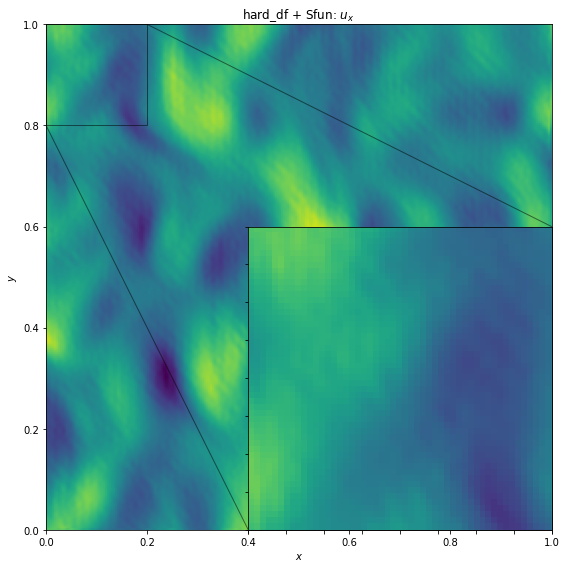

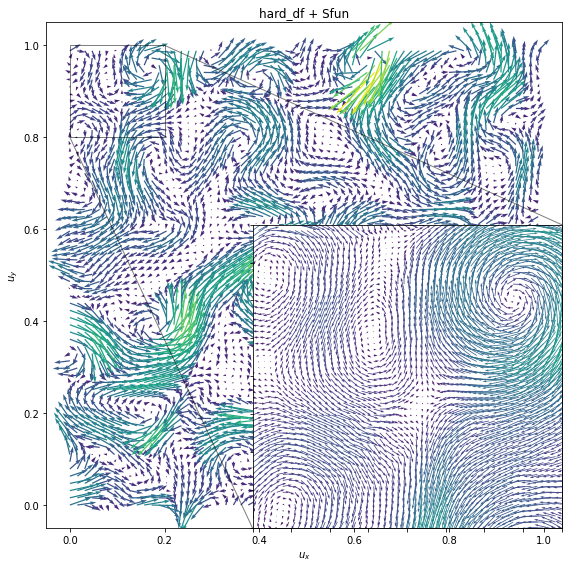

version_34 hard_df + Sfun + all


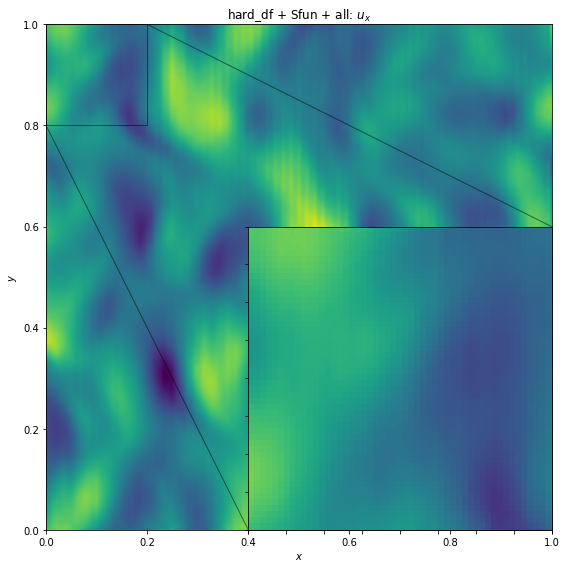

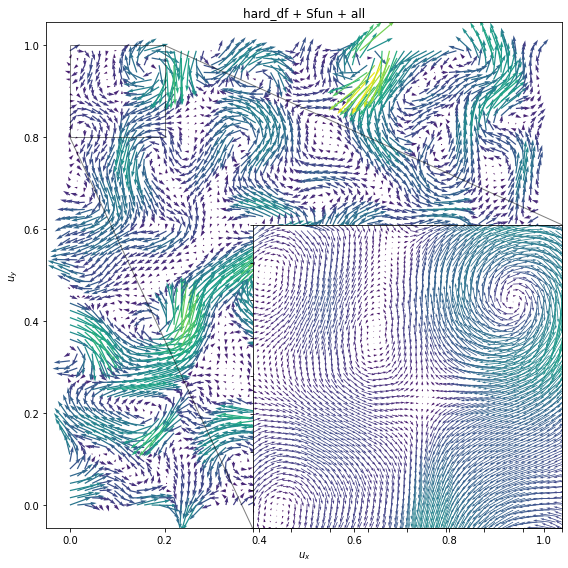

version_35 soft_df + Sfun + all


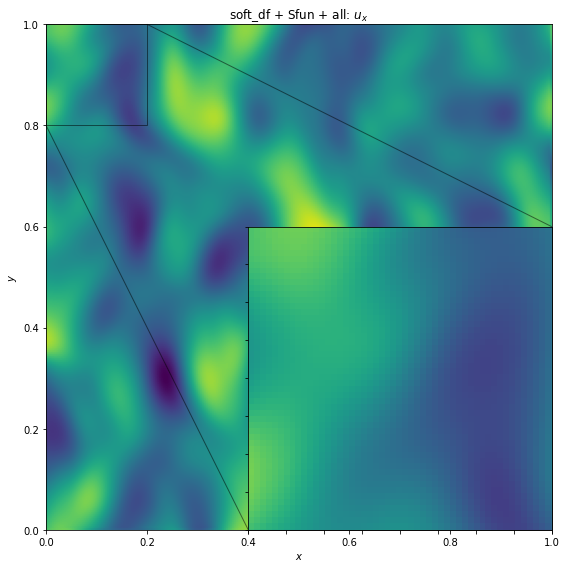

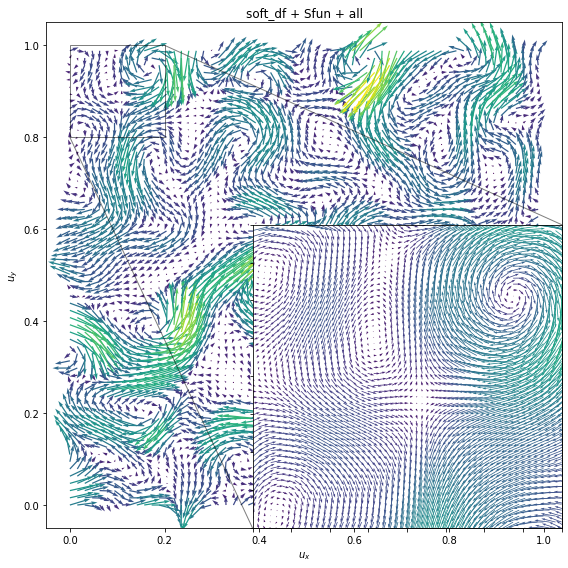

In [21]:
Xlr = dsets_dict['test']['X']
Ulr = dsets_dict['test']['y']
L = dsets_dict['test']['R']
Xhr = dsets_dict['test']['X']
Uhr = dsets_dict['test']['y']
H = dsets_dict['test']['R']

curr_df = df

figsize = (8,8)

for r, row in curr_df.iterrows():    
    
    if r not in [4, 0, 12, 11, 25, 28, 29, 30]:
        continue
        
        
    if r == 4:
        label = 'Vanilla'
    if r == 0:
        label = 'soft_df'
    if r == 2:
        label = 'soft_df + grad'
    if r == 12:
        label = 'hard_df'
    if r == 11:
        label = 'hard_df + grad + curl'
    if r == 25:
        label = 'soft_df + Sfun'
    if r == 30:
        label = 'soft_df + Sfun + all'        
    if r == 28:
        label = 'hard_df + Sfun'
    if r == 29:
        label = 'hard_df + Sfun + all'
    
    model_path = row['model_path']
    rff_num = row['rff_num']
    do_divfree = row['do_divfree']
    lam_grads = row['lam_grads']
    lam_curl = row['lam_curl']
    version = row['version']
    
    hc_or_sc = 'Hard' if do_divfree else 'Soft'
    title = r'%s $\lambda$ = %.1E $\lambda$ = %.1E' % (hc_or_sc, lam_grads, lam_curl)
    title = label
    print(version, title)
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    Uhr = model(X_hr)[0]
    Uhr = Uhr.detach().cpu().numpy()

    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)

    viz.plot_lr_hr_inset(Uhr, Uhr, H, H, figsize=figsize, title=title, 
                         region = region,
                         only_u=True)
    plt.show()

    viz.plot_velocity_field(Xhr.detach().cpu(), Uhr, L, Xhr.detach().cpu(), Uhr, H,
                            title=title,
                            figsize=figsize,
                            region = region,
                            scale_lr=10, step_lr=4,
                            scale_hr=5, step_hr=1)
    plt.tight_layout()
    plt.show()

4 RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:0-lgrd:0-lcrl:0-lsfn:0-ni:3
0 RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:1e-3-lgrd:0-lcrl:0-lsfn:0-ni:3
12 RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:true-lsdv:0-lgrd:0-lcrl:0-lsfn:0-ni:3
11 RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:true-lsdv:1e-3-lgrd:1e-5-lcrl:1e-8-lsfn:0-ni:3
29 RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:true-lsdv:0-lgrd:1e-5-lcrl:1e-8-lsfn:1e-3-ni:4
30 RFFMLP_run:333-ds:4-mlp:10-rff_num:512-df:false-lsdv:1e-3-lgrd:1e-5-lcrl:1e-8-lsfn:1e-3-ni:4


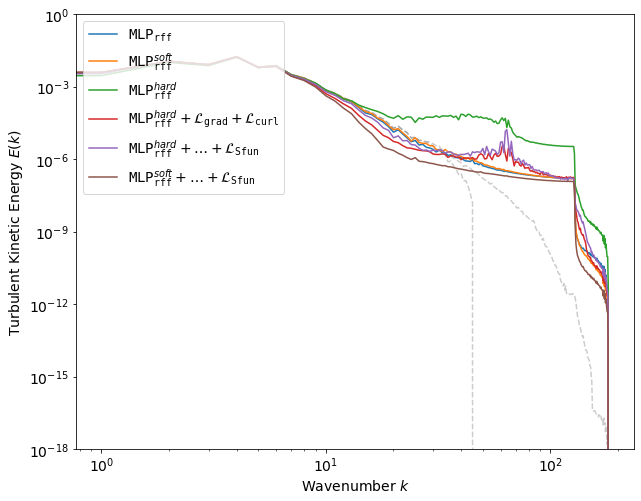

In [48]:
Xlr = dsets_dict['train']['X']
Ulr = dsets_dict['train']['y']
L = dsets_dict['train']['R']
Xhr = dsets_dict['test']['X']
Uhr = dsets_dict['test']['y']
H = dsets_dict['test']['R']

plt.rcParams["font.size"] = "14"
fig, ax1 = plt.subplots(figsize=(10,8))

speclr_gt = phy.energy_spectrum(Ulr.view(L,L,2).permute(2,0,1))[0]
spechr_gt = phy.energy_spectrum(Uhr.view(H,H,2).permute(2,0,1))[0]

ax1.loglog(speclr_gt.detach(), 'k--', alpha=0.2)
ax1.loglog(spechr_gt.detach(), 'k--', alpha=0.2)

c = 0
for r in [4, 0, 12, 11, 29, 30]:
# for r in [4]:
    
    if r == 4:
        label = r'$\mathtt{MLP}_\mathtt{rff}$'
    if r == 0:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft}$'
    if r == 2:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft} + \mathcal{L}_\mathtt{grad}$'
    if r == 12:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard}$'
    if r == 11:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard} + \mathcal{L}_\mathtt{grad} + \mathcal{L}_\mathtt{curl}$'
#     if r == 25:
#         label = 'soft_df + Sfun'
#     if r == 28:
#         label = 'hard_df + Sfun'
    if r == 29:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard} + \ldots + \mathcal{L}_\mathtt{Sfun}$'
    if r == 30:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft} + \ldots + \mathcal{L}_\mathtt{Sfun}$'
    
    
    model_path = df.at[r, 'model_path']
    print(r, df.at[r, 'name'])
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
#     ylr_hat = model(Xlr)[0]
#     spec = phy.energy_spectrum(ylr_hat.view(L,L,2).permute(2,0,1))[0]
#     plt.loglog(spec.detach().cpu().numpy(), alpha=0.2, color=f'C{c}')
    
    yhr_hat = model(Xhr)[0]
    spec = phy.energy_spectrum(yhr_hat.view(H,H,2).permute(2,0,1))[0]
    plt.loglog(spec.detach().cpu().numpy(), label=f'{label}', color=f'C{c}')

    c+=1

    
plt.ylim([1e-18, 1])
plt.legend(loc='upper left')
plt.ylabel(r'Turbulent Kinetic Energy $E(k)$')
plt.xlabel(r'Wavenumber $k$')
plt.show()

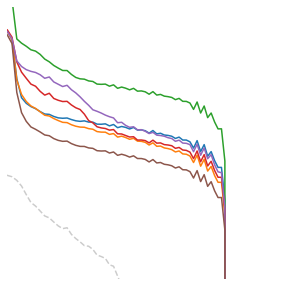

In [56]:
fig, ax1 = plt.subplots(figsize=(5,5))

speclr_gt = phy.energy_spectrum(Ulr.view(L,L,2).permute(2,0,1))[0]
spechr_gt = phy.energy_spectrum(Uhr.view(H,H,2).permute(2,0,1))[0]

ax1.loglog(speclr_gt.detach(), 'k--', alpha=0.2)
ax1.loglog(spechr_gt.detach(), 'k--', alpha=0.2)

c = 0
for r in [4, 0, 12, 11, 29, 30]:
# for r in [4]:
    if r == 4:
        label = r'$\mathtt{MLP}_\mathtt{rff}$'
    if r == 0:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft}$'
    if r == 2:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft} + \mathcal{L}_\mathtt{grad}$'
    if r == 12:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard}$'
    if r == 11:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard} + \mathcal{L}_\mathtt{grad} + \mathcal{L}_\mathtt{curl}$'
#     if r == 25:
#         label = 'soft_df + Sfun'
#     if r == 28:
#         label = 'hard_df + Sfun'
    if r == 29:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard} + \ldots + \mathcal{L}_\mathtt{Sfun}$'
    if r == 30:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft} + \ldots + \mathcal{L}_\mathtt{Sfun}$'
        
    model_path = df.at[r, 'model_path']
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
#     ylr_hat = model(Xlr)[0]
#     spec = phy.energy_spectrum(ylr_hat.view(L,L,2).permute(2,0,1))[0]
#     plt.loglog(spec.detach().cpu().numpy(), alpha=0.2, color=f'C{c}')
    
    yhr_hat = model(Xhr)[0]
    spec = phy.energy_spectrum(yhr_hat.view(H,H,2).permute(2,0,1))[0]
    plt.loglog(spec.detach().cpu().numpy(), label=f'{label}', color=f'C{c}')

    c+=1


plt.xlim([127, 200])
plt.ylim([1e-15, 1e-6])
plt.axis('off')
plt.show()

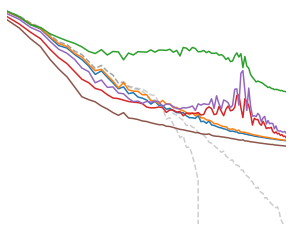

In [57]:
fig, ax1 = plt.subplots(figsize=(5,4))

speclr_gt = phy.energy_spectrum(Ulr.view(L,L,2).permute(2,0,1))[0]
spechr_gt = phy.energy_spectrum(Uhr.view(H,H,2).permute(2,0,1))[0]

ax1.loglog(speclr_gt.detach(), 'k--', alpha=0.2)
ax1.loglog(spechr_gt.detach(), 'k--', alpha=0.2)

c = 0
for r in [4, 0, 12, 11, 29, 30]:
    if r == 4:
        label = r'$\mathtt{MLP}_\mathtt{rff}$'
    if r == 0:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft}$'
    if r == 2:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft} + \mathcal{L}_\mathtt{grad}$'
    if r == 12:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard}$'
    if r == 11:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard} + \mathcal{L}_\mathtt{grad} + \mathcal{L}_\mathtt{curl}$'
#     if r == 25:
#         label = 'soft_df + Sfun'
#     if r == 28:
#         label = 'hard_df + Sfun'
    if r == 29:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{hard} + \ldots + \mathcal{L}_\mathtt{Sfun}$'
    if r == 30:
        label = r'$\mathtt{MLP}_\mathtt{rff}^{soft} + \ldots + \mathcal{L}_\mathtt{Sfun}$'
    
    model_path = df.at[r, 'model_path']
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
#     ylr_hat = model(Xlr)[0]
#     spec = phy.energy_spectrum(ylr_hat.view(L,L,2).permute(2,0,1))[0]
#     plt.loglog(spec.detach().cpu().numpy(), alpha=0.2, color=f'C{c}')
    
    yhr_hat = model(Xhr)[0]
    spec = phy.energy_spectrum(yhr_hat.view(H,H,2).permute(2,0,1))[0]
    plt.loglog(spec.detach().cpu().numpy(), label=f'{label}', color=f'C{c}')

    c+=1


plt.xlim([10, 90])
plt.ylim([1e-9, 1e-3])
plt.axis('off')
plt.show()

In [ ]:
curr_df = df.loc[
                (df['lam_sdiv'] == 0) &
                (df['lam_grads'] == 0) &
                (df['lam_curl'] == 0) &
                (df['lam_sfn'] == 0)
]

plt.figure(figsize=(10,5))
plt.subplot(131)
sns.barplot(x='rff_num', y='ang',data=curr_df)
plt.subplot(132)
sns.barplot(x='rff_num', y='rec',data=curr_df)
plt.show()

print(curr_df.index)

spec_gt = phy.energy_spectrum(y_hr.view(H,H,2).permute(2,0,1))[0]
plt.figure(figsize=(10,5))
plt.loglog(spec_gt.detach(), 'k--')

for r, row in curr_df.iterrows():    
    
    model_path = row['model_path']
    rff_num = row['rff_num']
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    y_hat = model(X_hr)[0]
    
    spec = phy.energy_spectrum(y_hat.view(H,H,2).permute(2,0,1))[0]
    plt.loglog(spec.detach().cpu().numpy(), label=f'{rff_num}')

    
plt.legend()
plt.show()

In [ ]:
curr_df = df.loc[
                (df['lam_grads'] == 0) &
                (df['lam_curl'] == 0) &
                (df['lam_sfn'] == 0)
]

# plt.figure(figsize=(10,5))
# plt.subplot(131)
# sns.barplot(x='rff_num', y='ang',data=curr_df)
# plt.subplot(132)
# sns.barplot(x='rff_num', y='rec',data=curr_df)
# plt.show()

print(curr_df.index)

spec_gt = phy.energy_spectrum(y_hr.view(H,H,2).permute(2,0,1))[0]
plt.figure(figsize=(10,5))
plt.loglog(spec_gt.detach(), 'k--')

for r, row in curr_df.iterrows():    
    
    model_path = row['model_path']
    rff_num = row['rff_num']
    lam_sdiv = row['lam_sdiv']
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    y_hat = model(X_hr)[0]
    
    spec = phy.energy_spectrum(y_hat.view(H,H,2).permute(2,0,1))[0]
    plt.loglog(spec.detach().cpu().numpy(), label=f'{rff_num}_{lam_sdiv}')

    
plt.legend()
plt.show()

In [ ]:
curr_df = df.loc[
                (df['rff_num'] >= 256) &
                (df['lam_curl'] == 0) &
                (df['lam_sfn'] == 0)
]

plt.figure(figsize=(10,5))
plt.subplot(131)
sns.barplot(x='rff_num', y='ang',data=curr_df)
plt.subplot(132)
sns.barplot(x='rff_num', y='rec',data=curr_df)
plt.show()

print(curr_df.index)
curr_df

In [ ]:
spec_gt = phy.energy_spectrum(y_hr.view(H,H,2).permute(2,0,1))[0]
plt.figure(figsize=(10,5))
plt.loglog(spec_gt.detach(), 'k--')

for r, row in curr_df.iterrows():    
    
    model_path = row['model_path']
    rff_num = row['rff_num']
    lam_sdiv = row['lam_sdiv']
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    y_hat = model(X_hr)[0]
    
    spec = phy.energy_spectrum(y_hat.view(H,H,2).permute(2,0,1))[0]
    plt.loglog(spec.detach().cpu().numpy(), label=f'{rff_num}_{lam_sdiv}')

plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='rff_num', y='ang', hue='lam_grads', data=df, size='lam_sdiv')

In [ ]:
spec_gt = phy.energy_spectrum(y_hr.view(H,H,2).permute(2,0,1))[0]
plt.figure(figsize=(10,5))
plt.loglog(spec_gt.detach(), 'k--')

for r, row in df.iterrows():    
    
    if r not in [8, 23, 70, 42, 19, 79]:
        continue
    
    model_path = row['model_path']
    rff_num = row['rff_num']
    lam_sdiv = row['lam_sdiv']
    
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    y_hat = model(X_hr)[0]
    
    spec = phy.energy_spectrum(y_hat.view(H,H,2).permute(2,0,1))[0]
    plt.loglog(spec.detach().cpu().numpy(), label=f'{rff_num}_{lam_sdiv}')

plt.tight_layout()
plt.legend()
plt.show()